# Assignment 7.1: Pitching Your ML Algorithm

Find an exciting business problem, find data, and solve the problem with machine learning in Python using the CRISP-DM methodology and algorithms covered in the course:
1. Business understanding - What does the business need?
2. Data understanding - What data do we have/need? Is it clean?
3. Data preparation - How do we organize the data for modeling?
4. Modeling - What modeling techniques should we apply?
5. Evaluation - Which model best meets the business objectives?
6. Deployment - How to get the model in production and ensure it works?

Note: it is required that your team use GitHub to host your code, collaborate and manage versions. GitHub helps ensure traceability, allow rollback, and avoid unintended overwrites and loss of code. You can use the integration between Google Colab and GitHub to achieve the goals of the project.

Dataset: **Home Credit Default Dataset**

**Project Scenario:**
Before presenting to the executive decision-making body, there is a code review round and a technical solution review by a technical committee. The committee consists of fellow ML Engineers, Data Engineers, Architects, ML managers, and the Head of Machine Learning.
There are three key deliverables for this final team project:
Google Colab notebook (ipynb)
Business presentation slides (pptx/pdf)
Recorded video presentation (mp4)
The Colab notebook is for the technical committee, whereas the business brief is targeted to a non-technical executive committee. Both committees will view the slides and video. Please see the following explanation for the requirements on each file


**Google Colab Notebook with Python code:**
The Google Clab Notebook must be organized like a report where the code blocks are interspersed with text blocks. The text block that appears before the code block must cover the explanations of the approach. The text blocks that follow the output graphs and tables must contain inference, actionable insight, and recommendations. The code blocks themselves must be annotated with comments so they are readable.

The notebook must contain the following sections:

* Problem statement and justification for the proposed approach.
* Data understanding (EDA) - a graphical and non-graphical representation of relationships between the response variable and predictor variables.
* Data preparation.
* Feature engineering - data pre-processing - missing values, outliers, etc.
* Feature Selection - how were the features selected based on the data analysis?
* Modeling - selection, comparison, tuning, and analysis - consider ensembles.
* Evaluation - performance measures, results, and conclusions.
* Discussion and conclusions - address the problem statement and recommendation.

# Problem Statement

In [3]:
# @title Justification


In [4]:
# @title Deveopment Approach


# Data Preparation

In [5]:
# @title Imports
!pip install Cython dataprep pymrmr mrmr_selection --quiet

import pandas as pd
import numpy as np
from sklearn import metrics
from sklearn import tree
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn import metrics
from tabulate import tabulate
from mrmr import mrmr_classif
from dataprep.clean import clean_df
from dataprep.eda import create_report
from sklearn.preprocessing import LabelEncoder
from sklearn.datasets import make_classification
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectKBest
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [6]:
# @title Loading Data

# Read and store CSV files
train_csv_path = "application_train.csv"
test_csv_path = "application_test.csv"
previous_csv_path = "previous_application.csv"

# Load only the relevant columns from the CSV file
columns_to_load = ['SK_ID_CURR', 'NAME_CONTRACT_STATUS', 'NAME_CLIENT_TYPE', 'RATE_DOWN_PAYMENT', 'CNT_PAYMENT']

df_train = pd.read_csv(train_csv_path, index_col='SK_ID_CURR') # Dataset used for training the models
df_test = pd.read_csv(test_csv_path, index_col='SK_ID_CURR') # Dataset used to test after model creation
df_previous_application = pd.read_csv(previous_csv_path, usecols=columns_to_load)

# Feature Engineering

## Cleaning

In [7]:
le = LabelEncoder()

# Get categorical columns
categorical_cols_train = df_train.select_dtypes(include=['object', 'category']).columns
categorical_cols_test = df_test.select_dtypes(include=['object', 'category']).columns

# Drop rows with NaN values
df_train.dropna(inplace=True)
df_test.dropna(inplace=True)

# Apply LabelEncoder on categorical columns
for col in set(categorical_cols_train).union(set(categorical_cols_test)):
    if col in df_train.columns:
        df_train[col] = le.fit_transform(df_train[col])
        if col in df_test.columns:
            # Detect new categories in test set
            new_categories = set(df_test[col]).difference(le.classes_)
            # Drop rows with new categories
            df_test = df_test.loc[~df_test[col].isin(new_categories)]
            # Transform the remaining data
            df_test[col] = le.transform(df_test[col])


In [8]:
# @title Cleaning data of null values

inferred_dtypes, df_train = clean_df(df_train)
inferred_dtypes, df_test = clean_df(df_test)

Data Type Detection Report:
	These data types are supported by DataPrep to clean: ['coordinate']
Column Headers Cleaning Report:
	121 values cleaned (100.0%)
Downcast Memory Report:
	Memory reducted from 9436394 to 3509616. New size: (37.19%)
Data Type Detection Report:
	These data types are supported by DataPrep to clean: ['coordinate']
Column Headers Cleaning Report:
	120 values cleaned (100.0%)
Downcast Memory Report:
	Memory reducted from 1889856 to 712170. New size: (37.68%)


ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'reg_region_no...ion', 'reg_city_not_...ity'


DataPrep Report
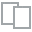
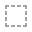
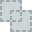
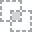
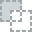
...
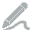
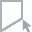
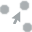
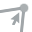
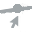

In [9]:
# @title Exploration - Post Clean
create_report(df_train)

In [10]:
# Split the train dataset into features and target
X = df_train.drop('target', axis=1)  # Features excluding 'TARGET'
y = df_train['target']  # Target variable

In [11]:
# @title Select top 100 features

# create some data
X, y = make_classification(n_samples=len(X), n_features = X.shape[1])
X = pd.DataFrame(X)
y = pd.Series(y)

# use mrmr classification
selected_features = mrmr_classif(X, y, K = 100) # reduce features to 100

100%|██████████| 100/100 [00:16<00:00,  5.96it/s]


In [12]:
# @title Top Features move to dataframe
column_names = X.columns.tolist()
# Slice the original dataframe using the selected features indices
X_selected = X.iloc[:, selected_features]

# Assign the column names to the selected features
X_selected.columns = [column_names[idx] for idx in selected_features]

X = X_selected
X.shape

(8602, 100)

In [13]:
 # @title Standardizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [14]:
# @title Attribute Transformation - PCA

pca = PCA(n_components=100)
X_pca = pca.fit_transform(X_scaled)

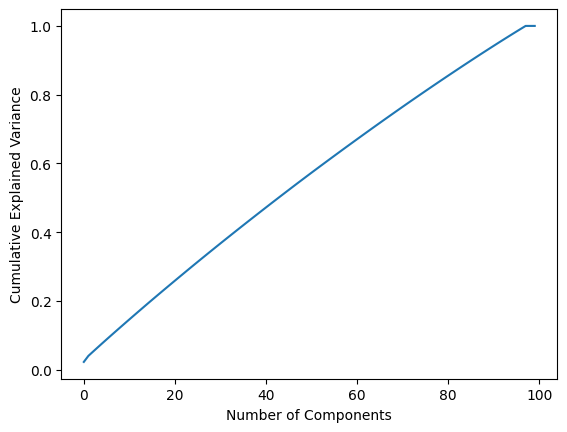

In [15]:
# Number of components
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.show()

In [16]:
# @title Components to capture 95% of variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
num_components = np.where(cumulative_variance > 0.95)[0][0] + 1
num_components

92

In [32]:
# Transform the data with selected number of components
pca = PCA(n_components=num_components)
X_pca = pca.fit_transform(X_scaled)
X_pca = pd.DataFrame(X_pca)

# Now you can use pandas methods on df_pca
X_pca.head()

,0,1,2,3,4,5,6,7,8,9,...,82,83,84,85,86,87,88,89,90,91
0,1.148411,-0.195144,-0.093111,0.104902,0.961217,0.615446,-0.833336,1.005289,-0.301517,0.842960,...,-0.831297,0.018729,-0.343682,0.776711,-0.419022,0.510483,-0.161897,0.265200,0.933629,-1.350029
1,1.205812,-0.384397,-0.674888,0.179159,-0.899063,-0.316064,-0.736846,-0.051679,-1.017587,-0.584844,...,0.564430,-1.394974,-0.560999,-0.498520,-0.015510,0.130763,0.948379,-0.717553,-1.027318,0.373437
2,1.165805,0.705697,-0.274396,0.883508,-0.386280,-1.390634,1.632703,2.362548,0.007490,1.282482,...,0.593648,0.887409,1.036288,-0.580132,-0.115231,-0.024404,-1.435164,-1.073039,-0.935007,0.096948
3,-2.551965,0.031724,-4.199640,-0.899062,0.922358,-2.880160,-1.037567,-0.780708,0.038122,3.266337,...,-0.427880,-0.278607,-1.305962,0.549207,0.487848,-1.028007,0.433484,1.036984,-1.235675,-1.240135
4,-1.524090,0.263642,-1.093565,-1.965289,1.331823,-1.082097,0.464564,0.180145,2.277263,-1.765642,...,1.287958,0.615605,0.302502,-0.517090,1.491166,-2.806668,1.832243,-0.215477,-1.528565,0.617712


# Feature Selection

In [33]:
# Split the train dataset into features and target
X = df_train.drop('target', axis=1)  # Features excluding 'TARGET'
y = df_train['target']  # Target variable

X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.3, random_state=1) # 70% training and 30% test

# Modeling

In [34]:
param_grid = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6, 7, 10],
    'subsample': [0.8, 0.9, 1]
}

gbc = GradientBoostingClassifier(random_state=42)

grid_search = GridSearchCV(estimator=gbc, param_grid=param_grid, cv=3, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Create GradientBoostingClassifier with the best parameters
gbc = GradientBoostingClassifier(**best_params, random_state=42)

# Fit the model to the training data
gbc.fit(X_train, y_train)

KeyboardInterrupt: ignored

# Evaluation

In [ ]:
#@title Evaluating the Gradient Boost model
y_hat = gbc.predict(X_train) # Predict the response for train dataset
y_pred = gbc.predict(X_test) # Predict the response for test dataset
y_pred_proba = gbc.predict_proba(X_test) # Predicted probabilities of the target classes from a classifier.

# Compute training and test accuracy
print("Train Accuracy:", metrics.accuracy_score(y_train, y_hat))
print("Test Accuracy:", metrics.accuracy_score(y_test, y_pred))

# Compute F1-score
print("Train F1-Score:", f1_score(y_train, y_hat))
print("Test F1-Score:", f1_score(y_test, y_pred))

print(metrics.confusion_matrix(y_test, y_pred))
print(metrics.classification_report(y_test, y_pred))
y_pred_proba = gbc.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)
print("AUC:", auc)

scores = cross_val_score(gbc, X_train, y_train, cv=6)
print("Cross-Validation Accuracy Scores:", scores)

In [ ]:
# Create a DataFrame to store the evaluation metrics
metrics_table = pd.DataFrame(columns=['Model', 'Train Accuracy', 'Test Accuracy', 'Train F1-Score', 'Test F1-Score', 'Precision', 'Recall', 'AUC', 'AUPRC'])

# Define the models
models = {
    'gbc': gbc,
}

# Compute and populate the evaluation metrics for each model
for model_name, model in models.items():
    # Predict the response for train dataset
    y_hat = model.predict(X_train)
    # Predict the response for test dataset
    y_pred = model.predict(X_test)
    # Predicted probabilities of the target classes from a classifier
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    # Compute the evaluation metrics
    train_accuracy = metrics.accuracy_score(y_train, y_hat)
    test_accuracy = metrics.accuracy_score(y_test, y_pred)
    train_f1_score = metrics.f1_score(y_train, y_hat)
    test_f1_score = metrics.f1_score(y_test, y_pred)
    precision = metrics.precision_score(y_test, y_pred)
    recall = metrics.recall_score(y_test, y_pred)
    auc = metrics.roc_auc_score(y_test, y_pred_proba)
    auprc = average_precision_score(y_test, y_pred_proba)

    # Compute the confusion matrix
    confusion_mat = metrics.confusion_matrix(y_test, y_pred)

    # Add the metrics to the table
    metrics_table = metrics_table.append({
        'Model': model_name,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Train F1-Score': train_f1_score,
        'Test F1-Score': test_f1_score,
        'Precision': precision,
        'Recall': recall,
        'AUC': auc,
        'AUPRC': auprc
    }, ignore_index=True)

    # Print the confusion matrix
    print(f"Confusion Matrix for {model_name}:")
    print(confusion_mat)
    print()

    # Print the additional evaluation metrics
    print("Train Accuracy:", train_accuracy)
    print("Test Accuracy:", test_accuracy)
    print("Train F1-Score:", train_f1_score)
    print("Test F1-Score:", test_f1_score)
    print("Precision:", precision)
    print("Recall:", recall)
    print(metrics.classification_report(y_test, y_pred))
    print("AUC:", auc)
    print("AUPRC:", auprc)
    print()

    # Plot ROC curve
    fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc:.2f})')

# Plot the diagonal line
plt.plot([0, 1], [0, 1], 'k--')

# Set labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

# Set legend
plt.legend()

# Show the plot
plt.show()

# Display the comparison table
print(tabulate(metrics_table, headers='keys', tablefmt='github'))

# Conclusion